In [1]:
from TO_sim.Animation import *
from TO_sim.To_Draw import *
from TO_sim.Hysteresis_Kuramoto import *
from IPython.display import HTML
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from TO_sim.Utility import *
matplotlib.rcParams['animation.embed_limit'] = 2**128

In [21]:
t_end = 200
m = 6
N = 500
dist = "Quantile Lorentzian"
dK = 0.2
dt = 0.1
Ksdf,Ksrdf = Hysteresis_pd(m,N=N,dK=dK,t_end=t_end,dist=dist,dt=dt,seed="Uniform")

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

In [4]:
Create_Folder("Review/Review7/Check Synchronize")

c:\Users\kim9y\Desktop\Kuramoto\Kuramoto-model\TO_sim\Check_theorical.py:23: RuntimeWarning: invalid value encountered in arcsin
  t_p = np.arcsin(O_p/x)


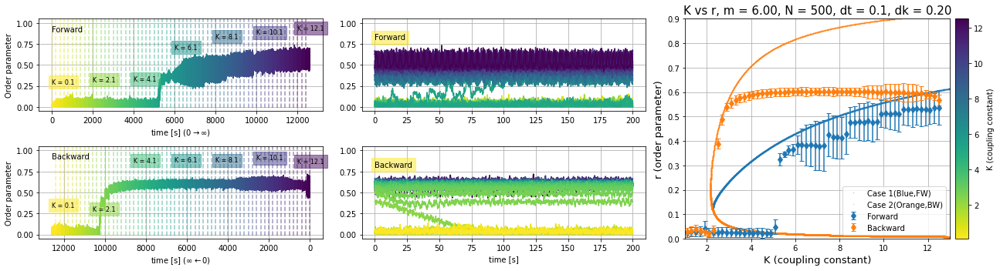

In [22]:
Time_R_df_total(Ksdf,Ksrdf,N,m,save=True,Folder_name="Review/Review7/Check Synchronize",dist=dist,mean_time=50,Draw_theorical=True)

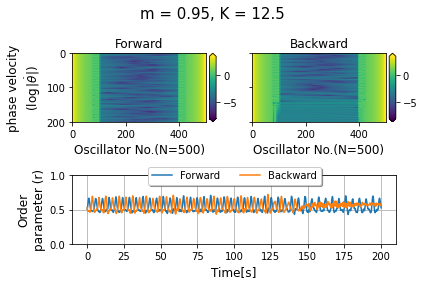

In [48]:
ani = Animation_logabs(Ksdf,Ksrdf,N,m)
HTML(ani.to_jshtml())

In [49]:
ani.save(f'Review/Review7/Check Synchronize/Animation/Check orderparameter. m={m},N={N}.mp4',dpi=400)


c:\Users\kim9y\Desktop\Kuramoto\Kuramoto-model\TO_sim\Animation.py:109: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.tight_layout()


In [27]:
Check_K,To_animate = Make_to_animate(Ksrdf,[[2.5,150,199.9],[2.3,0,199.9]],time_interval=10)

max_,min_
0.2382887243260512 -0.23658232117478195


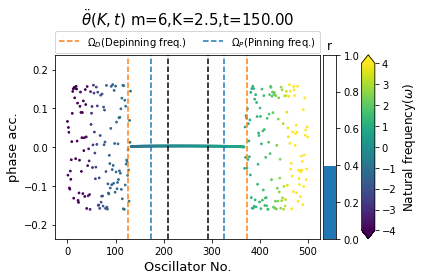

In [28]:
ani = ddtheta_animation(Ksrdf,To_animate,Check_K,m)

In [29]:
HTML(ani.to_jshtml())

In [31]:
Create_Folder("Review/Review7/Check Synchronize/Animation")
ani.save(f'Review/Review7/Check Synchronize/Animation/phase acc. m={m},N={N},K={Check_K}.mp4',dpi=400)

In [ ]:
ani.save(f'Review/Review5/Animation/phase Total m={m},N={N},K={Check_K}.mp4',dpi=400)


In [33]:
def Check_Syncro_K(Ksdf,Ksrdf):
    C_K = Ksdf.index
    omega = Ksdf["Omega"].iloc[0]
    Omega_D = lambda df,K : df['rs'][K]*K
    Omega_P = lambda x,m : (4/np.pi)*np.sqrt(x/m)
    O_lset = lambda x:np.searchsorted(omega,-x)
    O_rset = lambda x:np.searchsorted(omega,x)
    O_D = Omega_D(Ksdf,C_K)
    O_P = O_D.apply(Omega_P,m=m)
    O_Dlidx = O_D.apply(O_lset)
    O_Plidx = O_P.apply(O_lset)
    A = np.array([sum(O_Plidx[K_]>O_Dlidx[K_]) for K_ in C_K])
    
    O_D = Omega_D(Ksrdf,C_K)
    O_P = O_D.apply(Omega_P,m=m)
    O_Dlidx = O_D.apply(O_lset)
    O_Plidx = O_P.apply(O_lset)
    B = np.array([sum(O_Plidx[K_]>O_Dlidx[K_]) for K_ in C_K])
    return C_K,A,B

In [34]:
C_K,A,B =Check_Syncro_K(Ksdf,Ksrdf)
print(C_K[A>0][0],C_K[B>0][0])

1.9 2.3


In [ ]:
C_K = Ksdf.index
omega = Ksdf["Omega"].iloc[0]
KR = lambda df,K : df['rs'][K]*K
KMR = lambda x,m : (4/np.pi)*np.sqrt(x/m)
O_lset = lambda x:np.searchsorted(omega,-x)
O_rset = lambda x:np.searchsorted(omega,x)
KR_ = KR(Ksdf,C_K)
KMR_ = KR_.apply(KMR,m=m)
KR_lidx = KR_.apply(O_lset)
KR_ridx = KR_.apply(O_rset)

KMR_lidx = KMR_.apply(O_lset)
KMR_ridx = KMR_.apply(O_rset)
A = np.array([sum(KMR_lidx[K_]>KR_lidx[K_]) for K_ in C_K])

In [ ]:
A = np.array([sum(KMR_lidx[K_]>KR_lidx[K_]) for K_ in C_K])
# list(map(larger,C_K,KMR_lidx,KR_lidx))
# larger(C_K,KMR_lidx,KR_lidx)
# list(map(larger,KMR_lidx,KR_lidx))

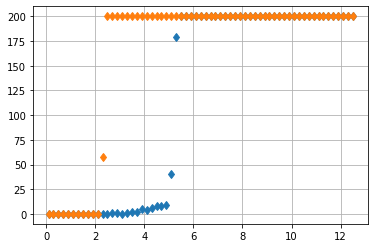

In [35]:
C_K,A,B = Check_Syncro_K(Ksdf,Ksrdf)
max_Kf = Ksdf["rs"].apply(np.max).values
max_Kb = Ksrdf["rs"].apply(np.max).values
min_Kf = Ksdf["rs"].apply(np.min).values
min_Kb = Ksrdf["rs"].apply(np.min).values
plt.plot(C_K,A*0.1,'d')
plt.plot(C_K,B*0.1,'d')
plt.grid()

In [74]:
C_K[A>0][0],C_K[B>0][0]

(3.9, 3.1)

In [44]:
Omega_D = lambda K,r : K*r
Omega_P = lambda K,r,m : (4/np.pi)*np.sqrt((K*r)/m)

In [36]:
Kspace = np.linspace(0.01,12.5,1000)
Rspace = np.linspace(0.01,1,1000)
KS,RS = np.meshgrid(Kspace,Rspace)

In [46]:
def K_R_theorical(K,Kc):
    R = lambda k: np.sqrt(1-Kc/k)
    r = np.array([R(x) if x>Kc else 0 for x in K])
    return r

In [39]:
def r_Case1(x,m,d):
    O_p = (4/np.pi)*np.sqrt(x/m)
    t_p = np.arcsin(O_p/x)
    pi = np.pi
    r_lock1 = (x/m**2)*((1/(pi*d**3))*np.log(np.sqrt(d**2+O_p**2)/O_p)-1/(2*pi*d*O_p**2))
    r_drift1 = (2/(pi*x))*(np.sqrt(d**2+x**2)*np.arctan(np.sqrt(d**2+x**2)*np.tan(t_p))-d*t_p)
    return r_lock1+r_drift1

r_Case2 = lambda x,m,d:(x/(m**2))*((1/np.pi*d**3)*np.log(np.sqrt(d**2+x**2)/(x))-1/(2*np.pi*d*x**2))+(np.sqrt(d**2+x**2)-d)/x

In [40]:
def Make_theorical_KR(Ks,Rs,m,d=1):

    X = np.linspace(0.001,30,5000)
    K_list1 =[]
    R_list1 =[]
    K_list2 =[]
    R_list2 =[]
    d = 1

    for K_  in  Kspace[::1]:
            i=0
            # plt.plot(X,X/K_)
            i+=1
            TEMP_2 = (X/K_)[abs(r_Case2(X,m,d)-X/K_)<1e-3]
            if len(TEMP_2)!=0:
                for R_ in TEMP_2:
                    K_list2.append(K_)
                    R_list2.append(R_)
            TEMP_1 = (X/K_)[abs(r_Case1(X,m,d)-X/K_)<1e-3]
            if len(TEMP_1)!=0:
                for R_ in TEMP_1:
                    K_list1.append(K_)
                    R_list1.append(R_)
    return K_list1,R_list1,K_list2,R_list2
# plt.plot(X,X/K)
# plt.ylim(0,1)
# # plt.xlim(1)
# # plt.legend(fontsize=12)
# plt.xlabel("$x \equiv rK$",fontsize=18)
# plt.ylabel("r (order parameter)",fontsize=18)
# plt.title(f"x vs r(x), m={m} d={d}",fontsize=20)
# plt.tight_layout()
# # plt.savefig(f"Review2/m={m}, d={d} x vs r(x).png",dpi=400)

C:\Users\kim9y\AppData\Local\Temp\ipykernel_40328\2720400848.py:3: RuntimeWarning: invalid value encountered in arcsin
  t_p = np.arcsin(O_p/x)


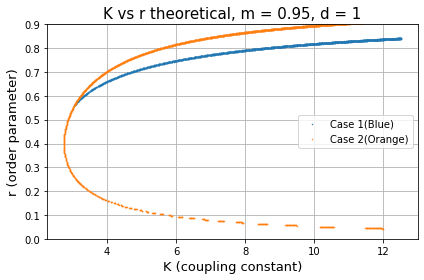

In [42]:
K_list1,R_list1,K_list2,R_list2 = Make_theorical_KR(Kspace,Rspace,m)
plt.plot(K_list1,R_list1,'.',markersize=1,label="Case 1(Blue)")
plt.plot(K_list2,R_list2,'.',markersize=1,label="Case 2(Orange)")
d=1
# plt.xlim(1,13)
plt.ylim(0,0.9)
plt.xlabel("K (coupling constant)",fontsize=13)
plt.ylabel("r (order parameter)",fontsize=13)
plt.title(f"K vs r theoretical, m = {m}, d = {d}",fontsize=15)
plt.legend()
plt.grid()
plt.tight_layout()
# plt.savefig(f"Review2/m={m}, d={d} K vs r.png",dpi=400)


C:\Users\kim9y\AppData\Local\Temp\ipykernel_40328\2720400848.py:3: RuntimeWarning: invalid value encountered in arcsin
  t_p = np.arcsin(O_p/x)


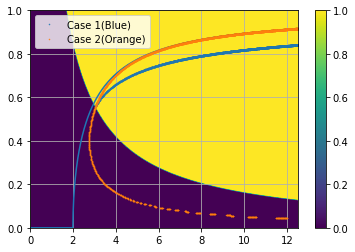

In [47]:
m = 0.95
K_list1,R_list1,K_list2,R_list2 = Make_theorical_KR(Kspace,Rspace,m)
OP = Omega_P(KS,RS,m)
OD = Omega_D(KS,RS)
plt.imshow(OD,origin='lower',aspect='auto',extent=[0,12.5,0,1])
plt.imshow(OP,origin='lower',aspect='auto',extent=[0,12.5,0,1])
plt.imshow((OD>=OP),origin='lower',aspect='auto',extent=[0,12.5,0,1])
plt.plot(Kspace, K_R_theorical(Kspace,2))
plt.plot(K_list1,R_list1,'.',markersize=1,color='tab:blue',label="Case 1(Blue)")
plt.plot(K_list2,R_list2,'.',markersize=1,color='tab:orange',label="Case 2(Orange)")

# plt.plot(C_K,max_Kf,'.',color='tab:blue')
# plt.plot(C_K,min_Kf,'.',color='tab:blue')
# plt.plot(C_K,max_Kb[::-1],'.',color='tab:orange')
# plt.plot(C_K,min_Kb[::-1],'.',color='tab:orange')
plt.legend()
plt.plot()
plt.grid()

plt.colorbar()
# OP[OD<OP][1,:]

In [ ]:
np.searchsorted(Kspace,3.9)

In [71]:
K_list1[0],K_list2[0]

(3.0585085085085084, 2.7584584584584584)

In [ ]:
(OD<OP).shape

In [ ]:
OD[1].shape

In [ ]:
Temp = [OP[i][x_] for i,x_ in enumerate(OD<OP)]

In [ ]:
plt.plot(Kspace,[max(t_) for t_ in Temp],',')

In [ ]:
Temp[-1].shape

In [ ]:
[Omega_P(KS,RS,6)>Omega_D(KS,RS)]

In [ ]:
(Omega_P(KS,RS,2)>Omega_D(KS,RS)).min()

In [ ]:
a  =15
if  a:print(a)